# The Heat Equation
- The model problem for the time-dependent PDE reads
$$
\begin{aligned}
\frac{\partial u}{\partial t} & =k(\mathbf{x},\omega)\nabla^2 u+f & & \text { in } \Omega \times(0, T], \\
u & =u_D=0 & & \text { in } \partial \Omega \times(0, T], \\
u & =u_0 & & \text { at } t=0 .
\end{aligned}
$$
- where
    - The variable $u$ is a function of both space and time, i.e., $u = u(\mathbf{x}, t)$, where the spatial domain is denoted by $\Omega(\mathbb{R}^{2})$.
    - The thermal diffusivity $\boldsymbol{x} \in \Omega=[-2,2] \times[-2,2]\subset \mathbb{R}^2$
    - The source function $f$ and boundary values $u_D$ may also vary with space and time.
    - The initial condition $u_0$ is defined in the spatial domain $\Omega(\mathbb{R}^{2})$.<br>

<br>

## Parameter Estimation Problem - Theory

Our uncertain paramater in this case is the thermal diffusivity $k(\mathbf{x})$.
Our observations consist of noisy observations of $u(x_j,t_i)$, that is, measurements of $u$ at locations $\{x_j\}_{j=1}^M$ in space and $\{t_i\}_{i=0}^{T}$ times.
Note that our parameter is now populated with noise that may be spatially varying and correlated.
Furthermore note that our uncertain parameter is now a function, and not just simple a point, so we need an effective way of parametrizing $k(\mathbf{x})$ for parameter estimation. 
This is where the KL expansion comes in


### The KL Expansion

We can describe $k(\boldsymbol{x})$ as a stochastic process, $K(\boldsymbol{x}, \omega)$, where $K$ is a function defined on the product
space $\boldsymbol{D} \times \Omega, \boldsymbol{x} \in \boldsymbol{D}$ is the index set of the location of the physical domain, and $\theta \in \Theta$ is
the sample space of the probability space, $(\Theta, \mathcal{F}, P)$.

Given a stochastic process $K(\boldsymbol{x}_{1}, \omega)$, with mean $\mu(\boldsymbol{x})$ and symmetric positive semi- 
definite covariance function $\boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right) \in \Omega \times \Omega \to 
\mathbb{R}$, the Mercer theorem states that $\boldsymbol{C}$ can be decomposed as:
$$
\boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right)=\sum_{j=1}^{\infty} \lambda_j \psi_j(\boldsymbol{x}) \psi_j\left(\boldsymbol{x}_{2}\right),
$$
where $\lambda_j>0$ are the eigenvalues of $\boldsymbol{C}$, and $\psi_j$ are the corresponding normalized eigenvectors. The eigenpairs satisfy the Fredholm equation of the second kind:
$$
\int_{\Omega} \boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right) \psi_j\left(\boldsymbol{x}_{2}\right) d \boldsymbol{x}_{2}=\lambda_j \psi_j(\boldsymbol{x}_{1}), \quad j=1,2, \ldots
$$
Sequencing the eigenvalues in decreasing order, any realization of $K$ can then be written as Ghanem and Spanos (2003)
$$
K(\boldsymbol{x}, \omega)=\mu(\boldsymbol{x})+\sum_{j=1}^{\infty} \sqrt{\lambda_j} \psi_j(\boldsymbol{x}) \xi_j(\omega) .
$$
The coordinate coefficients $\xi_j(\omega)$ can be deterministically computed by evaluating the integrals
$$
\xi_j(\omega)=\int(K(\boldsymbol{x}_{1}, \omega)-\mu(\boldsymbol{x})) \psi_j(\boldsymbol{x}) d \boldsymbol{x}
$$


### KL Expansion for Gaussian Processes

In our case, note $k(\mathbf{x})$ is a Gaussian process $(G P), \xi_j(\omega)$, i.e. it is a Gaussian-independent identically distributed random variables with zero mean and unit variance, such that $\mathbb{E}\left[\xi_j \xi_j^{\prime}\right]=$ $\delta_{j j^{\prime}}$.
The parameter field $K$ is then fully characterized by a set of coordinates $\xi_j$ 's given the eigenbasis is known.
By truncating the series givn above to retain the first few $K$ terms, the KL expansion efficiently approximates the highdimensional parameter field using a few dominant modes.
The size of the retained terms $K$ depends on the desired energy percentage to be retained by the $\mathrm{KL}$ expansion, which is defined as $\sum_{j=1}^K \lambda_j / \sum_{j=1}^{\infty} \lambda_j$.
In practice, it is preferable to choose $K$ such that the truncated $\mathrm{KL}$ expansion encapsulates as much information as possible with respect to its infinite counterpart.
Larger $K$ are required for prior covariance functions with smaller correlation lengths for the $\mathrm{KL}$ expansion to capture a similar information percentage.
There exist several strategies to set $K$ in practice.
For instance, for $\lambda_1 \geq \lambda_2 \geq \ldots$, one can control the representation error on $K$ by selecting $K$ such that $\lambda_K<c \lambda_1$ or $\sum_{j=1}^K \lambda_j \leq c \sum_{j=1}^{\infty} \lambda_j$ for some truncation parameter $c \ll 1$

### Creating the Covariance Matrix

The one thing remaining is to determine the Covariance function $C(x_1, x_2)$ for determining the modes of our KL basis.
The covariance function encodes how correlated spatially we expect our function values to be.
A common kernel used as a Covariance function is based off a square exponential function.

The square exponential kernel function can be represented mathematically as:

$$C(x_i, x_j) = \exp \left( -\frac{1}{2} \sum_{d=1}^{D} \left(\frac{x_{i,d} - x_{j,d}}{\ell_d}\right)^2\right)$$

where $x_i$ and $x_j$ are two $D$-dimensional input vectors, $\ell_d$ is the length scale for dimension $d$ and $\alpha=2$ is a constant.
The covariance matrix, $C$, can be constructed by evaluating this kernel function for each pair of input points and multiplying byhe $\sigma^2$:

$$ C_{i,j} = \sigma^2 * C(x_i, x_j) $$

Note the standard deviation can be specified to be constant over the whole grid, or can be the same size of the grid and specified cell wise. 
The $\sigma$ set should be related to the expected measurement noise in the observation operator.
Note furthermore the importance of the length scale parameters $\ell_d$. 
They in a sense define how smooth we believe our kernel to be.
The large $\ell_d$, the more square exponential kernel will smooth the sum of the different components over the space since they will overlap more.
The smaller the $\ell_d$, the rougher the field we want to represent.

## Initial Conditions

- First Initial Condition: 
$$\exp\left[-\frac{1}{2} \left(\left(\frac{\boldsymbol{x}_{0}-0.01}{5}\right)^{2} + \left(\frac{\boldsymbol{x}_{1}-0.01}{5}\right)^{2} \right) \right]$$
- Second Inital Condition:
$$2* \exp\left[-0.1\left( \left(\boldsymbol{x}_{0}-1.0\right)^{2} + \left(\boldsymbol{x}_{1}-1.0\right)^{2} \right) \right]$$

## Spatially and time varying forcing function

In [1]:
from pydci.examples.heat_model import HeatModel
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import importlib

from pydci import OnlineSequential
from pydci.log import enable_log, disable_log
from pydci.utils import get_df, set_seed

class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            (2*np.sin(6 * np.pi * self.t) * x[0]
            +  np.cos(4 * np.pi * self.t) * x[1]),
        )

num_modes = 10
set_seed(2023)
enable_log(level="DEBUG")
hm = HeatModel(
    x0=None,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.05,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=0.2,
    length_scales=[0.1, 0.1],
    nmodes=num_modes,
    true_k_x=None,
    max_states=50,
    forcing_expression=ForcingFunction(),
)

[08/15/23 23:05:24] INFO     Logger initialized                                                           ]8;id=606079;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=214519;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#87\87]8;;\

                    DEBUG    Setting up simulation                                                 ]8;id=721845;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=47689;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#97\97]8;;\

[08/15/23 23:05:27] DEBUG    State idxs set at 500 of 2601 total indices                               ]8;id=728286;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=548258;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#100\100]8;;\

In [2]:
hm.lam_true

array([ 0.71167353, -0.32448496, -1.00187064,  0.23625079, -0.10215984,
       -1.14129263,  2.65440726,  1.44060519,  0.09890227, -3.12153215])

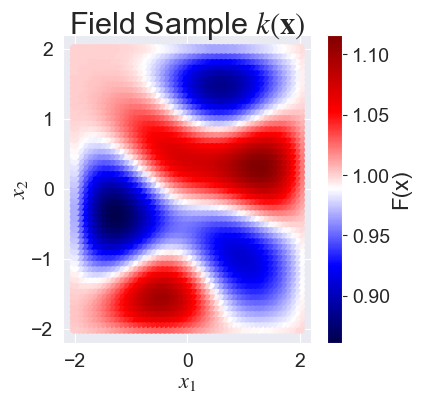

In [3]:
hm.plot_field()

In [4]:
hm.get_data(tf=3.0)
fig, axs = plt.subplots(4,5, figsize=(20, 20))
hm.plot_obs_state(axs=axs)

[08/15/23 22:44:03] INFO     Getting data for model from 0.0 to 3.0                                    ]8;id=846609;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=69914;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#389\389]8;;\

                    DEBUG    Constructing k_x field                                               ]8;id=60731;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=113317;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#258\258]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=894851;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=946953;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#264\264]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=939458;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=350832;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#274\274]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=479996;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=644038;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#289\289]8;;\

### Visualizing using pyvista

In [5]:
snapshots = hm.take_snaps(hm.data[-1], sample_ts=0.005)
hm.output_gif(snapshots, gif_name="./u_time_forced_true.gif")
Image(url="./u_time_forced_true.gif")

|███████████████████████████████████████▉⚠︎ (!) 599/600 [100%] in 54.0s (11.10/s)                                        


# Parameter Estimation Problem

In [1]:
enable_log(level='DEBUG', filter='pydci.consistent_bayes.OnlineSequential')
prob = OnlineSequential(
    hm,
    time_step=1.0,
)
prob.solve(
    num_its=6,
    max_t=None,
    num_samples=50,
    max_sample_size=100,
    samples_inc=10,
    time_step=1.0,
    exp_thresh=0.2,
    kl_thresh=3.0,
    min_eff_sample_size=0.9,
    num_tries_per_it=2,
    sampling_args={
        "dist": "normal",
        "mean": 0.0,
        "std_dev": 1.0,
    },
    solver_args=dict(
        pca_range=range(1, 3),
        split_range=range(1, 10),
        best_method="max_kl",
        all_data=True,
    ),
    make_plots=False,
    reset_model=True,
    reset_samples=False,
    seed=2023,
)
prob.probs[-1].results

NameError: name 'enable_log' is not defined

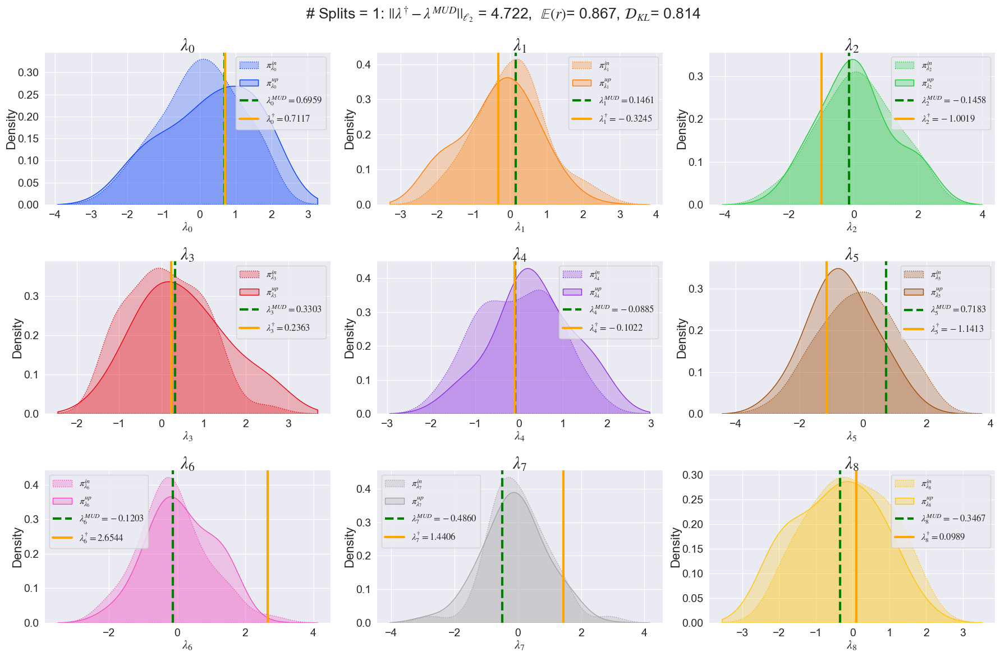

In [14]:
prob.probs[0].best.param_density_plots(lam_true=np.array([hm.lam_true]))

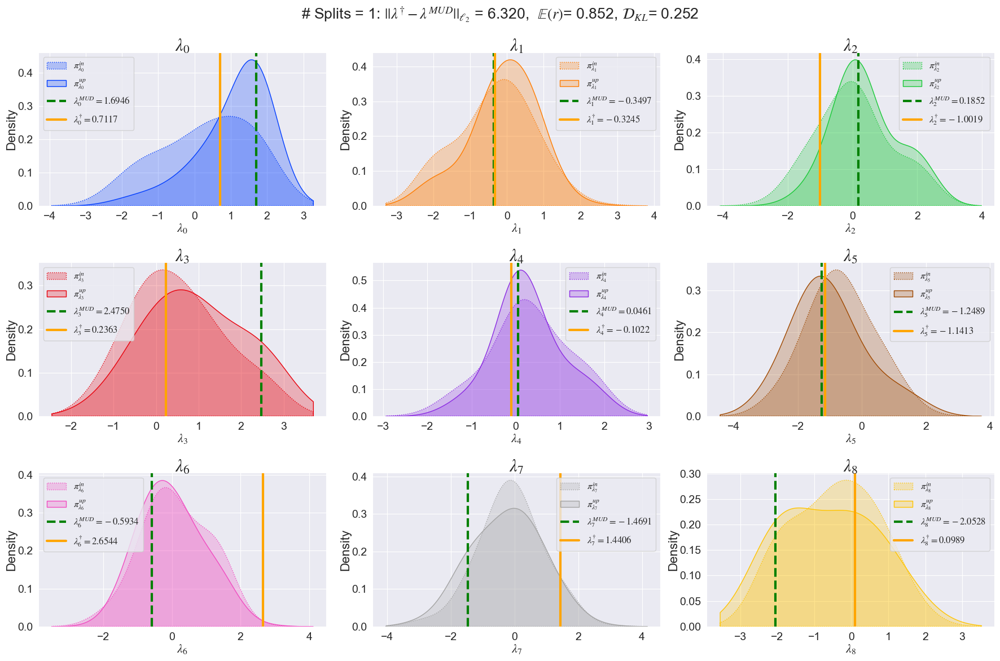

In [15]:
prob.probs[1].best.param_density_plots(lam_true=np.array([hm.lam_true]))

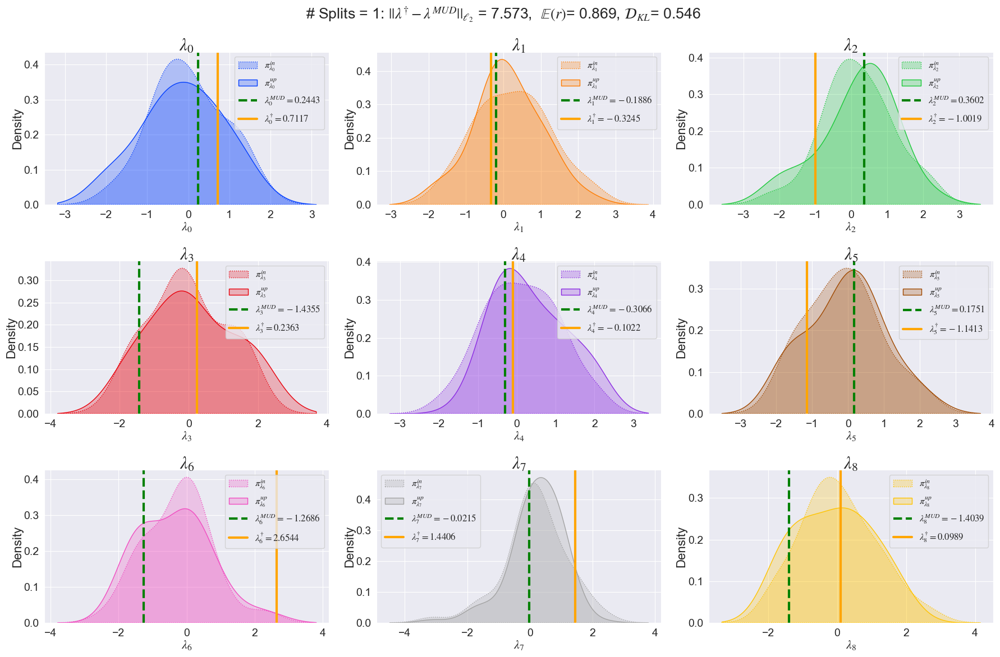

In [16]:
prob.probs[2].best.param_density_plots(lam_true=np.array([hm.lam_true]))

In [22]:
import pandas as pd
prob_best = prob.probs[-1].best
pd.concat(prob_best.results)

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i,I
0,0.865224,0.037242,1.0,1.0,True,None,-0.091768,1.579554,-1.938502,-0.46071,...,-0.155459,-0.760931,2.339482,0.718403,-1.946577,44,[0],"range(0, 275)",1,2
0,0.865224,0.037242,1.0,1.0,True,None,-0.091768,1.579554,-1.938502,-0.46071,...,-0.155459,-0.760931,2.339482,0.718403,-1.946577,44,[0],"range(275, 550)",2,2


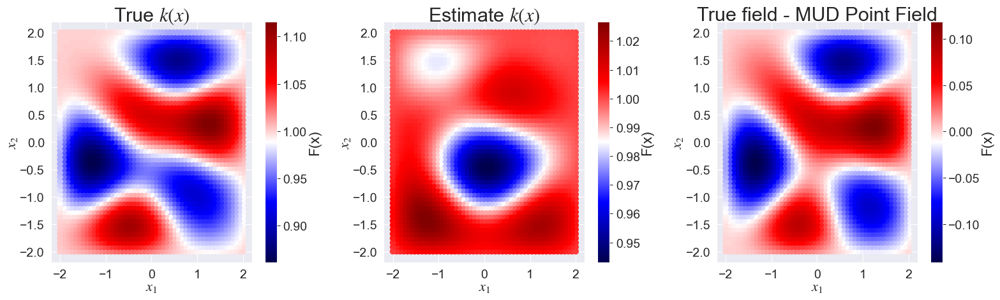

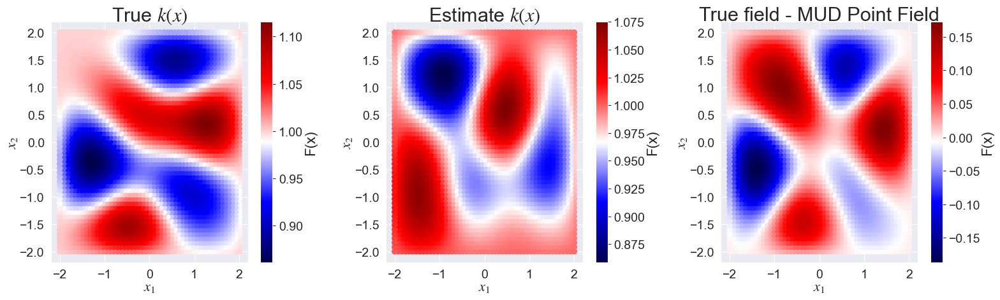

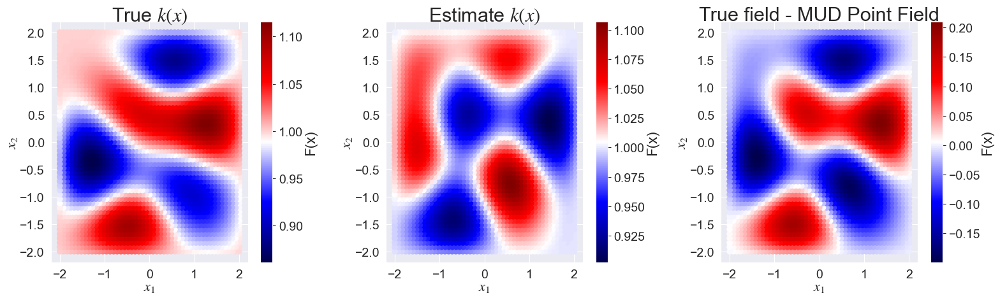

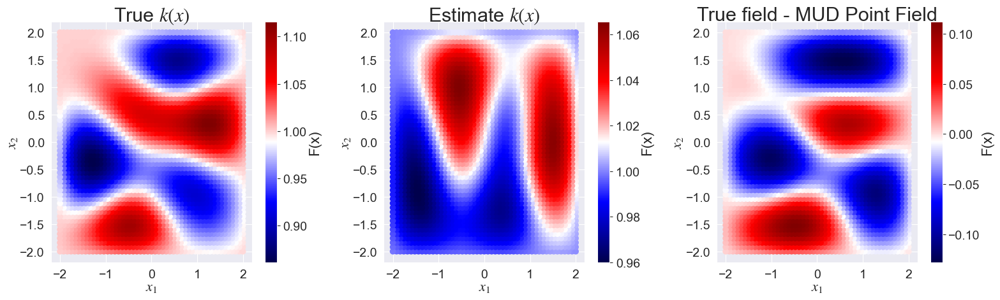

In [17]:
for p in prob.probs:

    fig, ax = plt.subplots(1, 3, figsize=(16, 5))
    mud_point = p.best.get_mud_point()[1][0]

    hm.plot_field(ax=ax[0])
    ax[0].set_title("True $k(x)$")
    hm.plot_field(field=mud_point, ax=ax[1])
    ax[1].set_title(f"Estimate $k(x)$")
    hm.plot_field(diff=mud_point, ax=ax[2])
    ax[2].set_title("True field - MUD Point Field")

    fig.tight_layout()

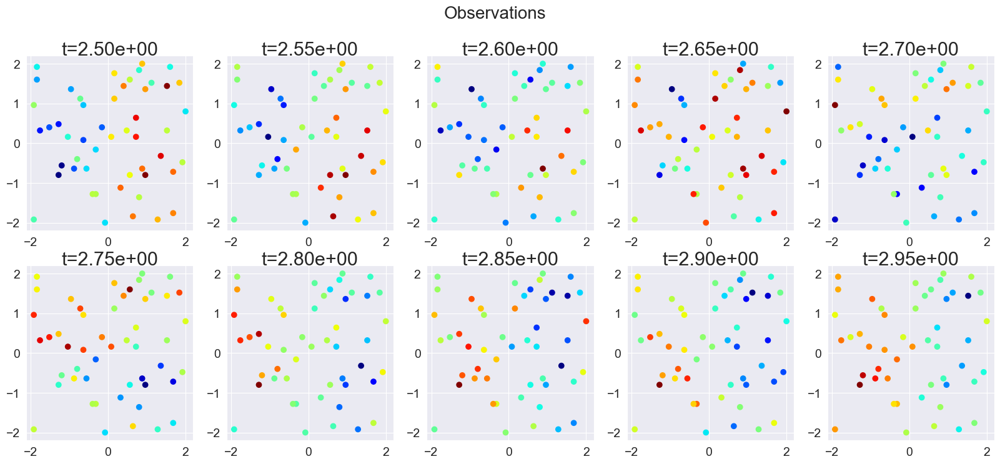

In [11]:
hm.plot_obs_state()

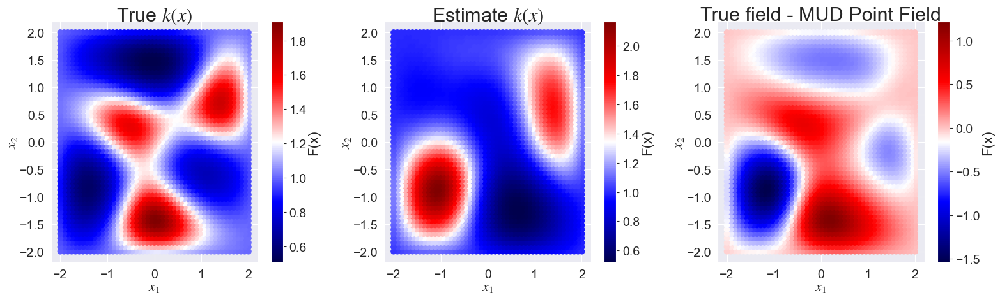

In [9]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

mud_point = prob_best.get_mud_point()[1][0]

hm.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm.plot_field(field=mud_point, ax=ax[1])
ax[1].set_title(f"Estimate $k(x)$")
hm.plot_field(diff=mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

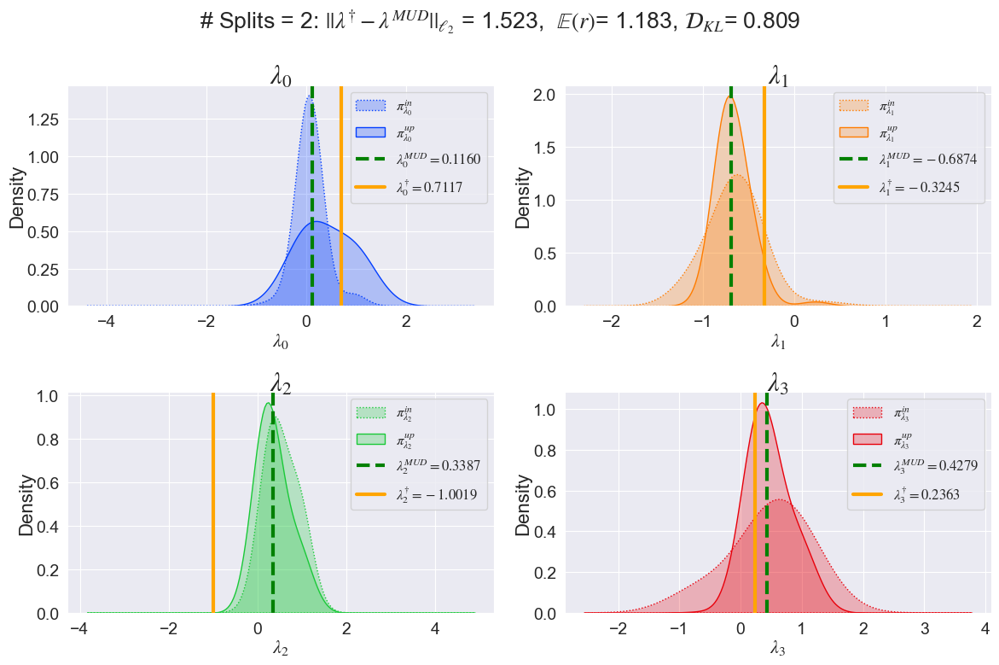

In [18]:
prob_best.param_density_plots(lam_true=hm.lam_true)

## Solution using 3 Splits

In [16]:
res_3 = prob.probs[-1].probs[2]
pd.concat(res_3.results)

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,pca_mask,i,I
0,1.001097,1.382541,1.000,0.763,True,None,-0.043382,-0.781068,-0.328422,0.541134,116,[0],"range(0, 1834)",1,3
0,1.001097,1.382541,0.763,0.240,True,None,-0.043382,-0.781068,-0.328422,0.541134,116,[0],"range(1834, 3667)",2,3
0,0.996909,1.795676,0.240,0.121,True,None,-0.250455,-0.163062,0.835079,1.311252,854,[0],"range(3667, 5500)",3,3


In [19]:
res_3.states[res_3.states['iteration'] == 3]

,lam_0,lam_1,lam_2,lam_3,q_pca_0,q_pca_1,q_pca_2,q_pca_3,weight,pi_in,pi_obs,pi_pr,ratio,weighted_ratio,pi_up,pred_assumption,iteration
0,-1.251635,0.452166,-0.904195,-0.343493,-1.030079,-10.868608,-14.439276,6.092188,6.366270e-152,1.962827e-107,2.346947e-01,0.026462,8.869079e+00,5.646295e-151,1.108270e-257,True,3
1,-0.035644,-1.104428,-0.761646,0.323732,0.703986,-8.323059,-1.311737,-2.711201,5.472228e-14,4.912872e-11,3.113814e-01,0.035375,8.802241e+00,4.816787e-13,2.366426e-23,True,3
2,-0.804070,-0.093997,0.243578,-0.080895,0.926890,-6.954815,-16.011708,-2.187990,4.938318e-44,1.093983e-30,2.596291e-01,0.036472,7.118521e+00,3.515352e-43,3.845735e-73,True,3
3,0.517284,-1.195379,2.385475,-0.095103,0.978976,3.917526,-17.507966,-18.575212,2.320736e-68,1.184083e-45,2.470572e-01,0.036726,6.727054e+00,1.561172e-67,1.848557e-112,True,3
4,2.316679,1.548448,0.586589,0.490034,8.401261,25.941916,-12.892971,-1.724990,7.043773e-277,1.223946e-190,1.881055e-16,0.057556,3.268213e-15,2.302055e-291,0.000000e+00,True,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.804867,0.827031,1.850848,1.260257,13.982011,-0.394522,-28.720082,-5.736675,1.808058e-01,2.885668e-03,1.410445e-43,0.034115,4.134369e-42,7.475180e-43,2.157088e-45,True,3
996,0.800512,1.319475,0.469565,0.756385,9.980339,12.779080,-16.735944,-0.055738,6.629993e-40,7.137079e-30,9.364613e-23,0.054645,1.713706e-21,1.136186e-60,8.109049e-90,True,3
997,1.187920,1.226835,-0.004440,1.693751,16.109719,13.319864,-10.886029,1.096934,3.420731e-70,1.624879e-49,1.762765e-57,0.022739,7.752185e-56,2.651814e-125,4.308876e-174,True,3
998,-0.442874,-0.926666,1.284990,-1.752138,-11.576184,-3.728301,-18.513378,-10.797959,8.965185e-27,4.115763e-21,3.172744e-30,0.005883,5.392868e-28,4.834806e-54,1.989892e-74,True,3


In [20]:
res_3.get_mud_point(iteration=0)

(116, array([[-0.04338168, -0.78106774, -0.32842168,  0.54113359]]))

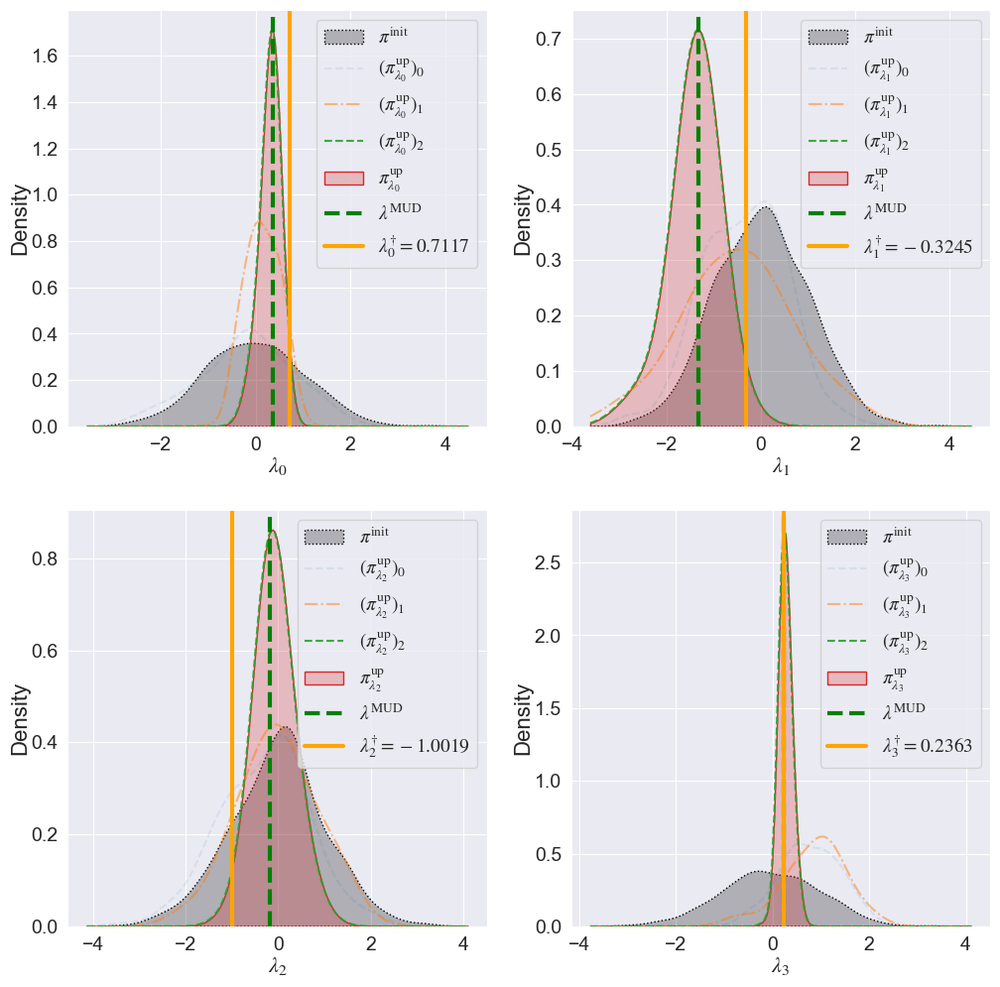

In [23]:
lam_true = hm.lam_true
fig, axs = plt.subplots(2, 2, figsize=(12, 12))
for i, ax in enumerate(axs.flatten()):
    res_3.plot_iterations(param_idx=i, iterations=range(3), ax=ax, lam_true=[lam_true])

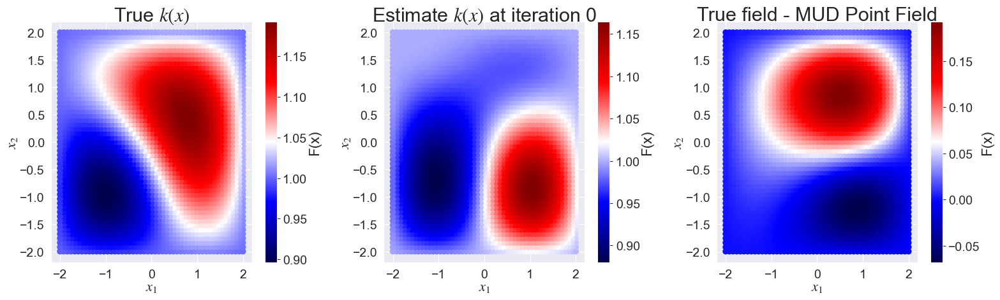

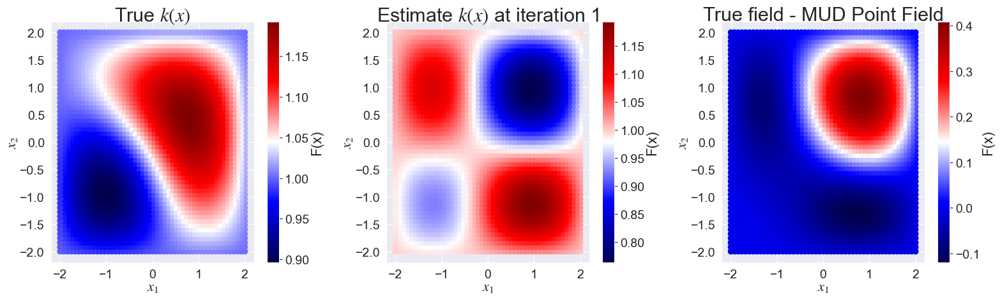

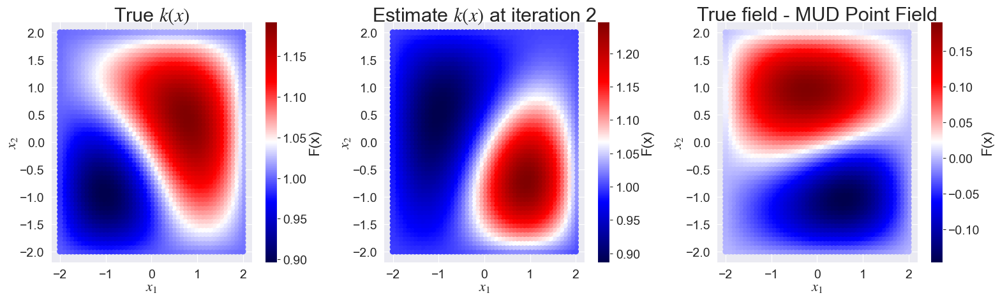

In [25]:
for i in range(len(res_3.results)):
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))

    mud_point = res_3.get_mud_point(iteration=i)[1][0]

    hm.plot_field(ax=ax[0])
    ax[0].set_title("True $k(x)$")
    hm.plot_field(field=mud_point, ax=ax[1])
    ax[1].set_title(f"Estimate $k(x)$ at iteration {i}")
    hm.plot_field(diff=mud_point, ax=ax[2])
    ax[2].set_title("True field - MUD Point Field")

    fig.tight_layout()

# Second Iteration



In [33]:
disable_log()
enable_log(level='DEBUG', filter='pydci.consistent_bayes.OnlineSequential', file='hm_forcing_iteration_2.log')
prob.solve(
    num_its=1,
    max_t=None,
    num_samples=1000,
    max_sample_size=None,
    samples_inc=None,
    time_step=1,
    exp_thresh=0.2,
    kl_thresh=3.0,
    min_eff_sample_size=0.9,
    num_tries_per_it=2,
    sampling_args={
        "dist": "normal",
        "mean": 0.0,
        "std_dev": 1.0,
    },
    solver_args=dict(
        pca_range=range(1, 4),
        split_range=range(1, 5),
        best_method="max_kl",
        all_data=True,
    ),
    make_plots=False,
    reset_model=False,
    reset_samples=False,
)
prob.probs[-1].results

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,I,search_index,predict_delta,within_thresh,valid,closest,max_kl,min_kl,num_samples,weighted
0,1.008761,3.127299,1.000,0.223,True,None,0.097548,0.844671,-1.049625,-0.129027,...,1,0,0.008761,True,True,True,True,False,1000,False
0,1.012250,2.923702,0.337,0.254,True,None,0.132682,1.095232,-1.379915,-0.135527,...,2,1,0.012250,True,True,False,False,False,1000,False
0,0.821864,1.422116,0.328,0.290,True,None,0.358877,0.005011,-0.898070,-0.018481,...,3,2,0.178136,True,True,False,False,True,1000,False
0,0.798390,0.968516,0.265,0.300,False,Failed to solve problem on iteration 4 - |E(r)...,0.631075,-0.599481,-1.010204,0.211645,...,4,3,0.201610,True,False,False,False,False,1000,False
0,0.799014,5.422778,1.000,0.072,False,Failed to solve problem on iteration 1 - |E(r)...,0.458104,-0.507822,-0.818820,0.167952,...,1,4,0.200986,True,False,False,False,False,1000,False
0,1.290526,4.202366,1.000,0.158,False,Failed to solve problem on iteration 1 - |E(r)...,0.525354,-0.541073,-0.990514,0.078431,...,2,5,0.290526,True,False,False,False,False,1000,False
0,1.245468,3.142779,1.000,0.407,False,Failed to solve problem on iteration 1 - |E(r)...,0.538368,-0.168337,-1.227322,0.013246,...,3,6,0.245468,True,False,False,False,False,1000,False
0,0.724320,1.394736,0.128,0.144,False,Failed to solve problem on iteration 4 - |E(r)...,0.472671,-0.507612,-0.956699,0.016224,...,4,7,0.275680,True,False,False,False,False,1000,False
0,0.196265,5.830136,1.000,0.070,False,Failed to solve problem on iteration 1 - |E(r)...,0.458104,-0.507822,-0.818820,0.167952,...,1,8,0.803735,False,False,False,False,False,1000,False
0,0.635722,4.272638,1.000,0.156,False,Failed to solve problem on iteration 1 - |E(r)...,0.538368,-0.168337,-1.227322,0.013246,...,2,9,0.364278,True,False,False,False,False,1000,False


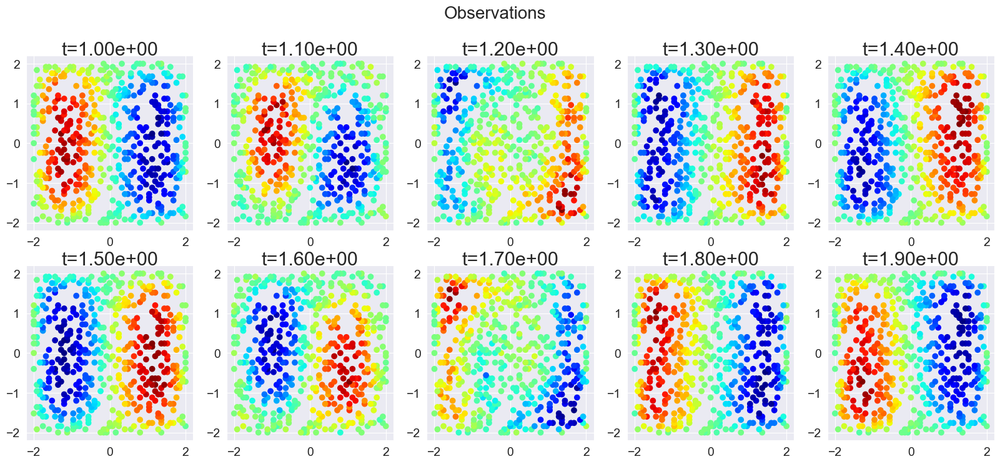

In [42]:
hm.plot_obs_state()

In [41]:
hm.save('hm_2_its.h5')

your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store.put("__attrs__", pd.Series(info_dict))



In [35]:
best = prob.probs[-1].best

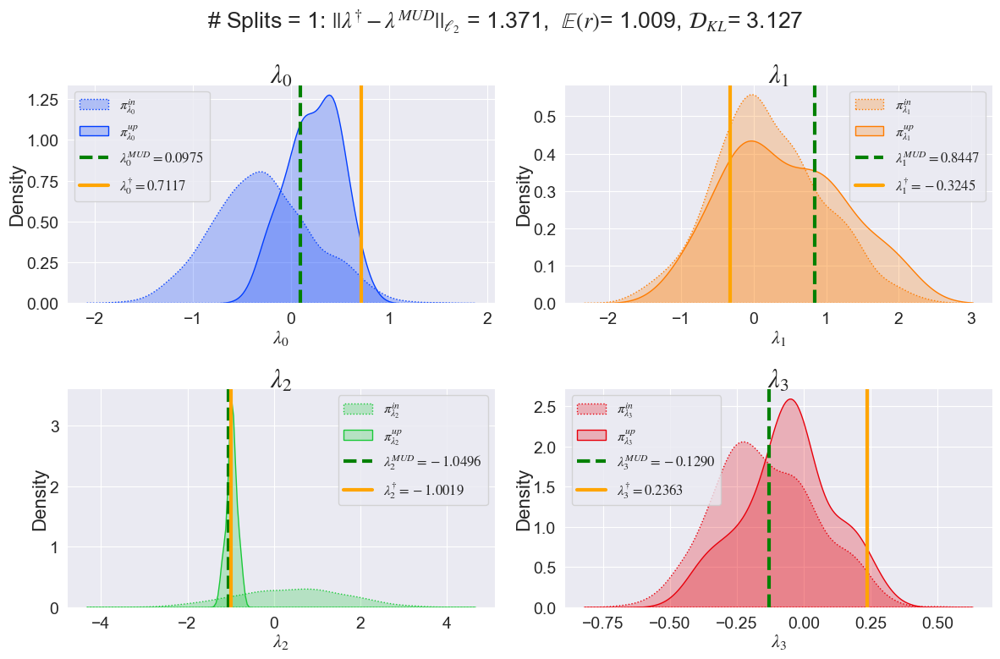

In [37]:
best.param_density_plots(lam_true=hm.lam_true)

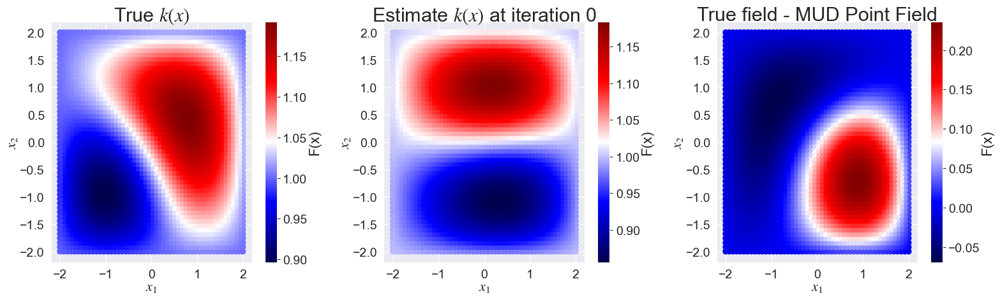

In [40]:
for i in range(len(best.results)):
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))

    mud_point = best.get_mud_point(iteration=i)[1][0]

    hm.plot_field(ax=ax[0])
    ax[0].set_title("True $k(x)$")
    hm.plot_field(field=mud_point, ax=ax[1])
    ax[1].set_title(f"Estimate $k(x)$ at iteration {i}")
    hm.plot_field(diff=mud_point, ax=ax[2])
    ax[2].set_title("True field - MUD Point Field")

    fig.tight_layout()

In [ ]:
# Solve using 1 principal component, 1 split, and all data
search_list = [
    {'exp_thresh': 1e10,
     'pca_components': [[0]],
     'pca_mask': None,
     'pca_splits': 1,
    }
]
import pydci.consistent_bayes.OfflineSequentialSearch as oss
import importlib
importlib.reload(oss)

enable_log(level='DEBUG')
data_idx = 0
search_prob = oss.OfflineSequentialSearch(
    prob.model.samples[data_idx],
    prob.model.data[data_idx],
    prob.model.measurement_noise,
    pi_in=prob.probs[data_idx].pi_in,
)
solve_args = dict(
    search_list=search_list,
    exp_thresh = 1e10,
    best_method = "closest",
)
search_prob.solve(**solve_args)

[08/15/23 09:23:03] INFO     Logger initialized                                                           ]8;id=35428;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=86593;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#87\87]8;;\

                    INFO     Searching through combinations:                         ]8;id=1594;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=915592;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#172\172]8;;\
                                  exp_thresh pca_components pca_mask  pca_splits                                   
                             0  1.000000e+10          [[0]]     None           1                                   

In [ ]:
search_prob.result

ERROR! Session/line number was not unique in database. History logging moved to new session 1006


In [ ]:
hm2.get_data(t0=0.0, tf=1.0)

[08/08/23 12:48:00] INFO     Getting data for model from 0.0 to 1.0                                    ]8;id=799040;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=163526;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#354\354]8;;\

                    DEBUG    Constructing k_x field                                               ]8;id=543491;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=467825;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#259\259]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=774687;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=897078;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#265\265]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=570730;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=432824;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#275\275]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=100558;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=448619;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#290\290]8;;\

[08/08/23 12:48:13] DEBUG    Shapes: (10000, 500), (10000, 2601), (10000,)                             ]8;id=656521;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=995774;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#369\369]8;;\

In [ ]:
hm2.data[0]

,ts,shift_idx,sample_flag,lam_true_0,q_lam_true_0,q_lam_true_1,q_lam_true_2,q_lam_true_3,q_lam_true_4,q_lam_true_5,...,q_lam_obs_490,q_lam_obs_491,q_lam_obs_492,q_lam_obs_493,q_lam_obs_494,q_lam_obs_495,q_lam_obs_496,q_lam_obs_497,q_lam_obs_498,q_lam_obs_499
0,0.0000,0,True,-1.085631,2.037954e-17,4.248354e-18,2.037954e-17,9.776158e-17,9.170085e-17,9.170085e-17,...,-0.04668,-0.006919,-0.057921,-0.003284,0.051314,-0.013688,0.054905,0.041859,0.025693,0.009283
1,0.0001,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-5.765875e-04,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0002,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-1.113291e-03,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0003,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-1.614504e-03,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0004,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-2.083998e-03,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.9996,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-4.861025e-02,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9996,0.9997,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-4.857169e-02,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9997,0.9998,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-4.853303e-02,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9998,0.9999,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-4.849428e-02,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Visualizing using pyvista

In [13]:
snapshots = hm.take_snaps(hm.data[-1], sample_ts=0.005)
hm.output_gif(snapshots, gif_name="../figures/u_time_forced_true.gif")
Image(url="../figures/u_time_forced_true.gif")

|███████████████████████████████████████▋⚠︎ (!) 98/99 [99%] in 8.4s (11.69/s)                                            


## Parameter Estimation Problem - 4 Dimensional

In [ ]:
hm2.lam_true

array([-1.0856306 ,  0.99734545,  0.2829785 , -1.50629471])

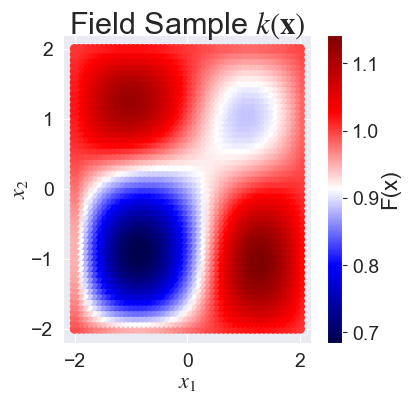

In [ ]:
hm2.plot_field()

In [ ]:
hm2.save('hm.h5')

[08/07/23 09:55:47] DEBUG    Saving data as DataFrame                                                  ]8;id=200257;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=387243;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#224\224]8;;\

your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store.put("__attrs__", pd.Series(info_dict))



In [ ]:
from pydci.examples.heat_model import HeatModel
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from pydci import OfflineSequential, OnlineSequential
from pydci.log import enable_log, disable_log
from pydci.utils import get_df, set_seed

class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            6 * np.sin(2 * np.pi * self.t) * x[0]
            + 2 * np.cos(6 * np.pi * self.t) * x[1],
        )
 
# disable_log()
enable_log(level='INFO')
hm = HeatModel(
    x0=None,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.1,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=1.0,
    length_scales=[0.1, 0.1],
    nmodes=4,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
    model_file='hm.h5'
)


[08/08/23 12:48:33] INFO     Logger initialized                                                           ]8;id=561995;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=176864;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#80\80]8;;\

                    INFO     Loading model state from state file at                                    ]8;id=64112;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=259243;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#162\162]8;;\
                             /Users/carlos/repos/pyDCI/notebooks/Examples/hm.h5                                    

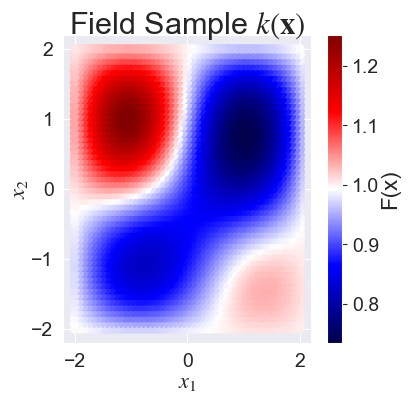

In [ ]:
hm.plot_field()

In [ ]:
hm.samples[0]

,lam_0,lam_1,lam_2,lam_3,q_lam_0,q_lam_1,q_lam_2,q_lam_3,q_lam_4,q_lam_5,...,q_lam_5490,q_lam_5491,q_lam_5492,q_lam_5493,q_lam_5494,q_lam_5495,q_lam_5496,q_lam_5497,q_lam_5498,q_lam_5499
0,2.398402,0.209391,0.339257,0.363429,-0.006164,0.038008,0.054501,0.035192,-0.112345,-0.020241,...,0.468623,0.414600,0.0,0.381878,0.161837,0.0,0.0,0.205124,0.0,0.0
1,0.159622,0.640704,0.921266,0.530817,-0.048342,0.034963,-0.023503,-0.021415,-0.077902,-0.111201,...,0.478693,0.422365,0.0,0.388675,0.163376,0.0,0.0,0.207487,0.0,0.0
2,2.709764,0.172250,-0.511626,1.658605,0.029461,-0.019512,-0.019549,0.010250,-0.069148,-0.068142,...,0.474737,0.419470,0.0,0.386230,0.163006,0.0,0.0,0.206799,0.0,0.0
3,-0.644560,0.510139,1.868396,-0.407551,0.112805,0.067712,-0.174210,0.042427,0.004928,-0.020097,...,0.477728,0.421531,0.0,0.387876,0.163054,0.0,0.0,0.207090,0.0,0.0
4,1.715961,0.291900,0.260809,0.723999,-0.070374,-0.035234,0.105442,0.025105,-0.024265,-0.064517,...,0.473163,0.418162,0.0,0.385003,0.162607,0.0,0.0,0.206249,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-0.578346,0.511904,0.410250,-0.023589,0.005691,0.061258,0.023504,0.041205,-0.053393,-0.001287,...,0.471113,0.416376,0.0,0.383371,0.161975,0.0,0.0,0.205497,0.0,0.0
96,0.534866,0.330758,0.984021,1.718588,-0.009682,-0.034862,-0.073485,-0.054101,-0.030356,-0.013231,...,0.490788,0.431936,0.0,0.397095,0.165537,0.0,0.0,0.210572,0.0,0.0
97,0.603362,2.865804,1.617897,0.474221,-0.056303,0.059851,-0.048947,0.017549,-0.061712,-0.044626,...,0.478933,0.422166,0.0,0.388755,0.163300,0.0,0.0,0.207628,0.0,0.0
98,0.790767,0.927379,-1.376941,0.398223,-0.088638,-0.025547,0.109583,-0.052919,0.031496,0.132473,...,0.457953,0.405901,0.0,0.374306,0.159659,0.0,0.0,0.202275,0.0,0.0


In [ ]:
# Solve using 1 principal component, 1 split, and all data
search_list = [
    {'exp_thresh': 1e10,
     'pca_components': [[0]],
     'pca_mask': None,
     'pca_splits': 1,
    }
]

In [ ]:
import pydci.consistent_bayes.OfflineSequentialSearch as oss
import importlib
importlib.reload(oss)

data_idx = 0
search_prob = oss.OfflineSequentialSearch(
    prob.model.samples[data_idx],
    prob.model.data[data_idx],
    prob.model.measurement_noise,
    pi_in=pi_in,
)
solve_args = dict(
    search_list=search_list,
    serach_comb_args=None,
    exp_thresh = 1e10,
    best_method = "closest",
    pi_in=pi_in,
)
search_prob.solve(**solve_args)
search_prob.search_results

[08/08/23 06:52:10] INFO     Searching through combinations:                         ]8;id=119990;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=933399;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#158\158]8;;\
                                  exp_thresh pca_components pca_mask  pca_splits                                   
                             0  1.000000e+10          [[0]]     None           1                                   

Solving for different combinations |                                        | ▁▃▅ 0/1 [0%] in 0s (~0s, 0.0/s) 

Solving for different combinations |                                        | ▂▄▆ 0/1 [0%] in 0s (~0s, 0.0/s) 

                    INFO     Iteration 0: Solving using (range(0, 5500), [0])              ]8;id=305159;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=394344;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#188\188]8;;\

on 0: WARNING:py.warnings:/Users/carlos/.mm/envs/fenics/lib/python3.10/site-packages/scipy/stats/_entropy.py:133: RuntimeWarning: invalid value encountered in divide
        pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)


Solving for different combinations |████████████████████████████████████████| 1/1 [100%] in 0.4s (2.23/s)               


,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits,search_index,predict_delta,within_thresh,closest,max_kl,min_kl
0,0.0,NaN,2.398402,0.209391,0.339257,0.363429,0,[0],1,0,1.0,True,True,False,False


In [ ]:
prob.search_results

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits,search_index,predict_delta,within_thresh,closest,max_kl,min_kl
0,0.0,NaN,2.398402,0.209391,0.339257,0.363429,0,[0],1,0,1.0,False,False,False,False
0,0.0,NaN,2.398402,0.209391,0.339257,0.363429,0,"[0, 1]",1,10,1.0,False,False,False,False


In [ ]:
from pydci.utils import get_search_combinations

get_search_combinations(
    len(self.meas)
    100, 10, 1000, max_num_combs=20)

ImportError: cannot import name 'get_search_combinations' from 'pydci.utils' (/Users/carlos/repos/pyDCI/src/pydci/utils.py)

In [ ]:
search_combs = {
    'exp_thresh': 1e10,
    'max_nc': 3,
    'all_data': True,
    'split_range': range(0, 10, 2)
}
solve_args = {'exp_thresh': 0.3, 'search_list': search_list}
enable_log(level='INFO', file='heat_solve.log')
prob.solve_till_thresh(
    0,
    start_sample_size=100,
    max_samples=200,
    samples_inc=20,
    pi_in=None,
    sampling_args={'mean': 1.0, 'std_dev': 1.0},
    solve_args=solve_args,
)

Solving for different combinations |⚠︎                                       | (!) 0/4 [0%] in 0.5s (0.00/s)             


AttributeError: 'str' object has no attribute 'update'

In [ ]:
prob.model.save('hm.h5')

your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store.put("__attrs__", pd.Series(info_dict))



In [ ]:
num_samples = 100
pi_in, samples = hm2.get_normal_initial_samples(num_samples=num_samples)
samples.shape

(100, 4)

In [ ]:
disable_log()
hm2.forward_solve(samples, restart=True)

In [ ]:
measurements = get_df(hm2.data[0].dropna(), "q_lam_obs", hm2.n_sensors)
measurements, measurements.shape

(array([[ 0.05388106,  0.00039901, -0.08511962, ...,  0.05107824,
          0.05304891,  0.0873647 ],
        [ 0.12020283,  0.14380145,  0.08703669, ..., -0.15015633,
          0.03480773, -0.13624253],
        [ 0.21888024,  0.25118357,  0.21733671, ..., -0.27789261,
         -0.15584626, -0.00946511],
        ...,
        [-0.22579653, -0.1869436 , -0.14663122, ...,  0.1933766 ,
          0.20073965, -0.02020877],
        [-0.16876127, -0.15245744, -0.1554438 , ...,  0.0446893 ,
          0.04515602,  0.05520697],
        [-0.06368514, -0.09739765, -0.19448661, ...,  0.15959087,
          0.07933409,  0.08884999]]),
 (11, 500))

In [ ]:
disable_log()
prob = OfflineSequential(
    hm2.samples[0], measurements.ravel(), hm2.measurement_noise, pi_in=pi_in
)
prob.solve(pca_components=[[0]], pca_splits=2, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits
0,0.771526,6.217966,0.281513,1.140067,-0.08069,-1.713102,57,[0],2


  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,

  c *= np.true_divide(1, fact)



ValueError: array must not contain infs or NaNs

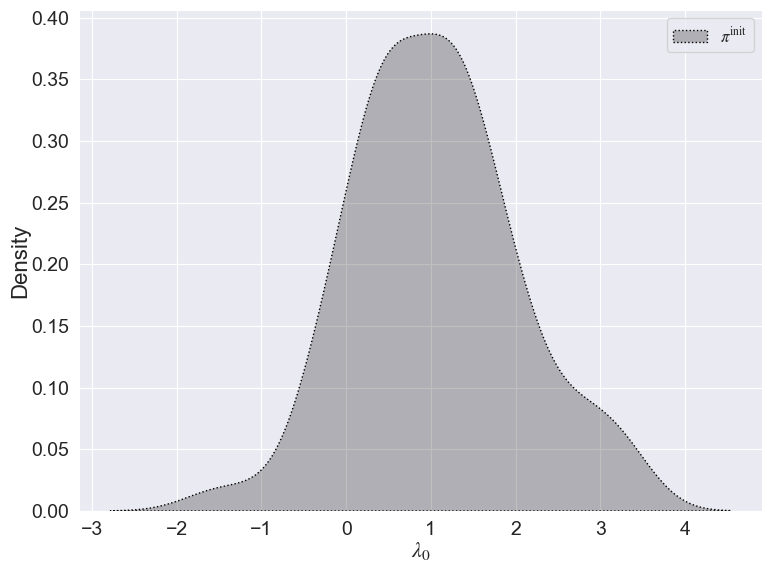

In [ ]:
prob.plot_iterations(lam_true=[hm2.lam_true])

In [ ]:
prob.mud_point

array([ 0.28151347,  1.14006745, -0.08069004, -1.71310199])

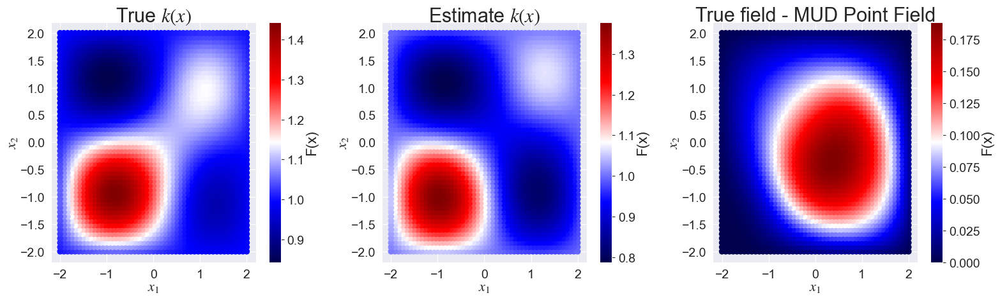

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm2.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm2.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm2.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

## Second Iteration

In [ ]:
hm2.get_data(1.0)

In [ ]:
num_samples = 100
samples_1 = prob.sample_dist(num_samples=num_samples)
pi_up_1 = prob.dists["pi_up"]
samples_1.shape

(100, 4)

In [ ]:
disable_log()
hm2.forward_solve(samples_1, restart=True)

In [ ]:
measurements = get_df(hm2.data[-1].dropna(), "q_lam_obs", hm2.n_sensors)
measurements, measurements.shape

(array([[-0.11259528, -0.17947601, -0.15307315, ...,  0.06837078,
          0.01200697, -0.11790626],
        [ 0.05210833,  0.07083338,  0.01031819, ..., -0.05684411,
         -0.05919235, -0.10119049],
        [ 0.18342016,  0.24107654,  0.2087223 , ..., -0.215004  ,
          0.01506741,  0.07306923],
        ...,
        [-0.15647908, -0.22096363, -0.28701788, ...,  0.26512085,
          0.05967818, -0.04785114],
        [-0.11123512, -0.10704408, -0.13067355, ...,  0.17179913,
         -0.05096112, -0.01301608],
        [-0.06873262, -0.07762806, -0.1615912 , ...,  0.18042091,
         -0.02719195,  0.01954276]]),
 (11, 500))

In [ ]:
disable_log()
prob = OfflineSequential(
    hm2.samples[1], measurements.ravel(), hm2.measurement_noise, pi_in=pi_in
)
prob.solve(pca_components=[[0, 1]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits
0,0.8233,0.562814,0.290852,0.961946,-0.137489,-1.688744,3,"[0, 1]",10


In [ ]:
prob.mud_point, hm2.lam_true

(array([ 0.29085227,  0.96194567, -0.13748922, -1.68874395]),
 array([-1.0856306 ,  0.99734545,  0.2829785 , -1.50629471]))

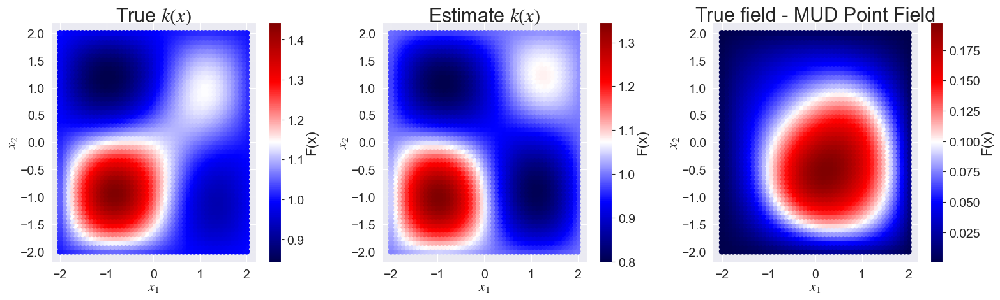

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm2.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm2.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm2.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

## Online sequential solve

In [ ]:
from pydci.examples.heat_model import HeatModel
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from pydci import PCAMUDProblem
from pydci.log import enable_log, disable_log
from pydci.utils import get_df, set_seed

set_seed(123)


class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            6 * np.sin(2 * np.pi * self.t) * x[0]
            + 2 * np.cos(6 * np.pi * self.t) * x[1],
        )


enable_log(level="DEBUG")
hm = HeatModel(
    x0=None,
    t0=0.0,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.1,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=1.0,
    length_scales=[0.1, 0.1],
    nmodes=4,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
)

[08/02/23 13:55:37] INFO     Logger initialized                                                           ]8;id=295600;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=666177;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

                    DEBUG    Setting up simulation                                                 ]8;id=321777;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=90567;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#91\91]8;;\

[08/02/23 13:55:53] DEBUG    State idxs set at: None                                                    ]8;id=930142;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=700109;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#90\90]8;;\

In [ ]:
import importlib
import pydci.consistent_bayes.OnlineSequential as os

importlib.reload(os)
prob = os.OnlineSequential(
    hm,
    def_init="normal",
)

In [ ]:
enable_log(level="INFO")
# prob.solve(
#     max_t=1,
#     num_samples=10,
#     time_step=1,
#     exp_thresh=0.5,
#     kl_thresh=4.5,
#     comb_args={
#         'max_nc': 2,
#         'exp_thresh': 1e10,
#         'split_range': [1, 2],
#     },
#     search_args={
#         'exp_thresh': 1e10,
#         'best_method': 'closest',
#     },
#     sampling_args={
#         'mean': 1.0,
#         'std_dev': 1.0,
#     }
# )

[08/02/23 15:26:12] INFO     Logger initialized                                                           ]8;id=296118;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=503838;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

<loguru.logger handlers=[(id=3, level=20, sink=<RichHandler (NOTSET)>)]>

## Iterative Breakdwon

In [ ]:
measurements = get_df(hm2.data[-1].dropna(), "q_lam_obs", hm2.n_sensors)
measurements, measurements.shape

(array([[-0.0503295 ,  0.04333017,  0.01859238, ..., -0.09026164,
          0.01672525, -0.03757275],
        [ 0.11129165,  0.02183807,  0.05497946, ..., -0.08927662,
         -0.03069886, -0.09858796],
        [ 0.36503246,  0.20933543,  0.30617139, ..., -0.3867091 ,
          0.03155849, -0.25270547],
        ...,
        [-0.49835249, -0.36362105, -0.50400411, ...,  0.50715134,
         -0.00785971,  0.24784683],
        [-0.27162777, -0.18832302, -0.31768101, ...,  0.3602917 ,
          0.06235934,  0.14456361],
        [-0.13244838, -0.03995926, -0.14832467, ...,  0.15198369,
         -0.05855545, -0.00311293]]),
 (11, 500))

In [ ]:
disable_log()
prob = PCAMUDProblem(
    hm2.samples[-1], measurements.ravel(), hm2.measurement_noise, pi_in=pi_in
)
prob.solve_it(pca_components=[[0]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,pca_mask,i
0,2.792011,2.155546,0.935686,0.21199,-0.225779,-0.405773,97,[0],"range(4950, 5500)",9


In [ ]:
prob.mud_point

array([ 0.93568636,  0.21198978, -0.22577909, -0.40577332])

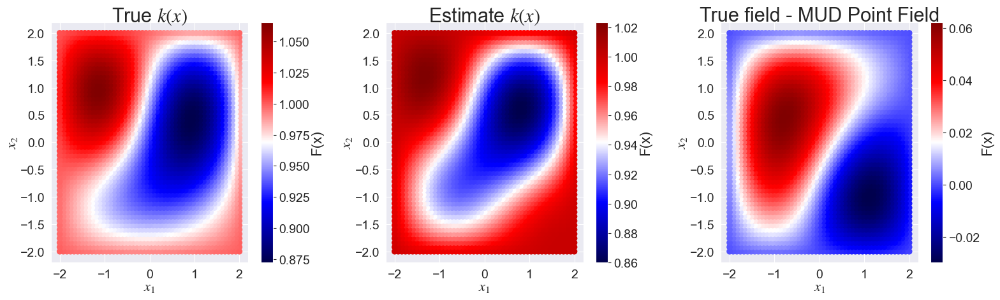

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm2.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm2.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm2.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

In [ ]:
prob.it_results

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,pca_mask,i
0,0.941807,0.423399,0.712320,0.342105,0.693094,0.891946,58,[0],"range(0, 550)",0
0,0.998670,0.012344,0.931816,0.294412,1.280604,2.716632,34,[0],"range(550, 1100)",1
0,0.987230,0.770167,1.743959,0.866069,0.928642,0.724075,29,[0],"range(1100, 1650)",2
0,1.078473,0.738110,1.743959,0.866069,0.928642,0.724075,29,[0],"range(1650, 2200)",3
0,0.817274,1.924596,0.086046,1.180829,-0.047040,-0.752936,35,[0],"range(2200, 2750)",4
0,0.311481,2.489514,0.712320,0.342105,0.693094,0.891946,58,[0],"range(2750, 3300)",5
0,1.444133,0.912239,0.869742,-0.148870,1.411826,1.559119,42,[0],"range(3300, 3850)",6
0,0.492424,1.112835,0.712320,0.342105,0.693094,0.891946,58,[0],"range(3850, 4400)",7
0,0.131915,3.530549,0.712320,0.342105,0.693094,0.891946,58,[0],"range(4400, 4950)",8
0,2.792011,2.155546,0.935686,0.211990,-0.225779,-0.405773,97,[0],"range(4950, 5500)",9


In [ ]:
its

array([0, 2, 4, 6, 8])

In [ ]:
hm2.lam_true

array([ 0.64766395,  0.23596671, -0.56365636, -0.32909588])

In [ ]:
import seaborn as sns

type(sns.color_palette())

seaborn.palettes._ColorPalette

In [ ]:
import seaborn as sns
import itertools
from itertools import cycle


def plot_iterations(
    self,
    param_idx=0,
    iterations=None,
    lam_true=None,
    shade=True,
    color=None,
    linestyle=None,
    ax=None,
):
    """
    Plot PCA iterations.

    Plots the initial distribution, the iterative updates, and the final solution
    as stored in the self.it_results and self.pca_states attributes of the
    PCAMUDselflem object, which are updated during a PCAMUDselflem.solve_it() call.
    The iterative updates correspond to using a re-weighted sequential data-consistent
    update, also known as "offline" sequential estimation, since iterations
    are performed on a static set of data/simulations.

    Parameters
    ----------
    param_idx : int
        Index of the parameter to plot.
    iterations : list of int
        List of iterations to plot. If None, iterations are not plotted, just initial and final.
    lam_true : list of float
        True value of the parameter. Plotted as vertical orange line. If None, no true value is plotted.
    shade : bool
        If True, the iterative updates will be plotted with increasing transparancy as the iteration number
        increases. Otherwise all plotted with the same transparancy (alpha).
    color : str
        Color to use for all lines. If None, a color palette is used, so all lines are different colors.
    linestyle : str
        Linestyle to use for all lines. If None, linestyles are cycled through ['--','-.'] for the
        iterative updates. Initial is always plotted with ':' and final with '-'.
    ax :
        Matplotlib axes object to use. If None, a new figure and axes are created.

    Results
    -------
    ax : matplotlib.axes.Axes
        The matplotlib axes object used.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))

    # Plot initial distribution
    _, labels = self.plot_L(
        param_idx=param_idx,
        iteration=0,
        initial_kwargs={
            "color": "black",
            "linestyle": ":",
            "label": "$\pi^\mathrm{init}$",
        },
        update_kwargs=None,
        mud_kwargs=None,
        lam_true=None,
        ax=ax,
    )

    if isinstance(color, str):
        colors = [color] * (len(iterations) + 1)
    else:
        colors = sns.color_palette(None, len(iterations) + 1)

    # Plot iterative updates, for each iteration specified
    if iterations is not None:
        ls = ["--", "-."]
        ls = [linestyle] * (len(iterations) + 1) if linestyle is not None else ls
        linecycler = cycle(ls)

        alphas = np.ones(len(its)) if not shade else np.linspace(0.1, 0.9, len(its))
        line_opts = {"fill": False}
        for i, it in enumerate(iterations):
            line_opts["alpha"] = alphas[i]
            line_opts["label"] = f"$\pi^\mathrm{{up}}_{{i}}$"
            line_opts["color"] = colors[i]
            line_opts["linestyle"] = next(linecycler)
            _, l = self.plot_L(
                param_idx=param_idx,
                iteration=it,
                initial_kwargs=None,
                update_kwargs=line_opts,
                mud_kwargs=None,
                lam_true=None,
                ax=ax,
            )
            labels += l

    # Plot final solution, with mud argument and true lambda
    line_opts = {"fill": True}
    line_opts["label"] = f"$\pi^\mathrm{{up}}$"
    line_opts["linestyle"] = "-"
    line_opts["color"] = colors[-1]
    mud_args = {"alpha": 1.0, "linestyle": "--", "label": "$\lambda^\mathrm{MUD}$"}
    # if 'color' in kwargs.keys():
    #     mud_args['color'] = kwargs['color']
    _, l = self.plot_L(
        param_idx=param_idx,
        iteration=len(self.it_results) - 1,
        initial_kwargs=None,
        update_kwargs=line_opts,
        mud_kwargs=mud_args,
        lam_true=lam_true,
        ax=ax,
    )
    labels += l
    ax.legend(labels=labels, loc="upper right", fontsize=14)

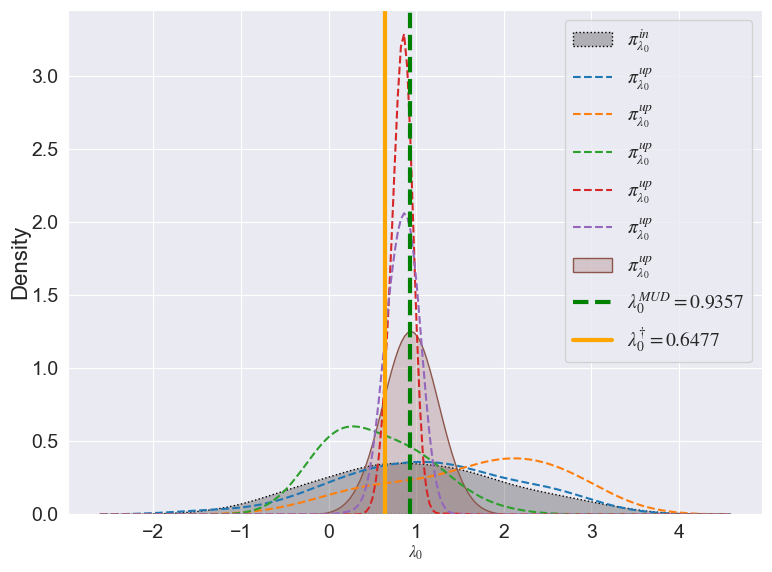

In [ ]:
plot_iterations(
    prob,
    param_idx=0,
    iterations=np.arange(0, len(prob.it_results) - 1, 2),
    lam_true=[hm2.lam_true],
    shade=False,
    linestyle="--",
)

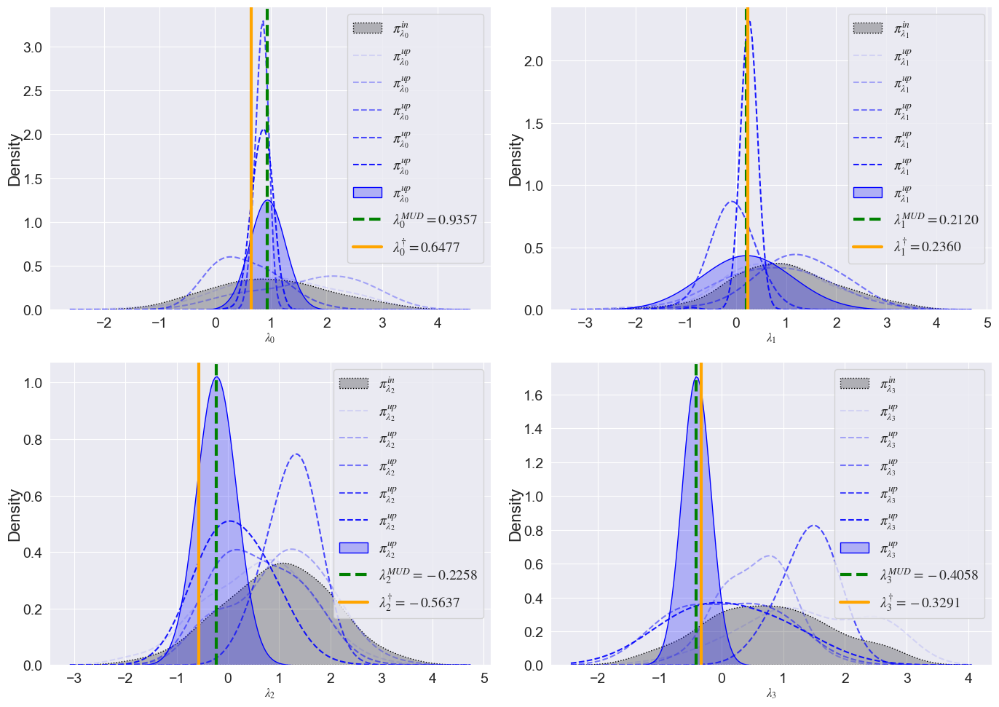

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

for i, ax in enumerate(axs.flatten()):
    plot_iterations(
        prob,
        param_idx=i,
        iterations=np.arange(0, len(prob.it_results) - 1, 2),
        lam_true=[hm2.lam_true],
        shade=True,
        color="blue",
        linestyle="--",
        ax=ax,
    )

# Parameter Estimation Problem - 10 Dimensional

In [ ]:
class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            np.sin(2 * np.pi * self.t) * x[0] + 2 * np.sin(6 * np.pi * self.t) * x[1],
        )


enable_log(level="DEBUG")
hm_3 = HeatModel(
    x0=None,
    t0=0.0,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.1,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=1.0,
    length_scales=[0.1, 0.1],
    nmodes=10,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
)

[07/31/23 17:43:33] INFO     Logger initialized                                                           ]8;id=516533;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=500812;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

                    DEBUG    Setting up simulation                                                 ]8;id=294346;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=862889;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#91\91]8;;\

[07/31/23 17:43:40] DEBUG    State idxs set at: None                                                    ]8;id=737501;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=274871;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#89\89]8;;\

In [ ]:
hm_3.lam_true

array([-0.64644406, -0.01549523, -0.37668279,  2.06648842, -0.78282961,
       -0.52980457,  0.01711592, -0.85698592, -1.64393602, -0.63882098])

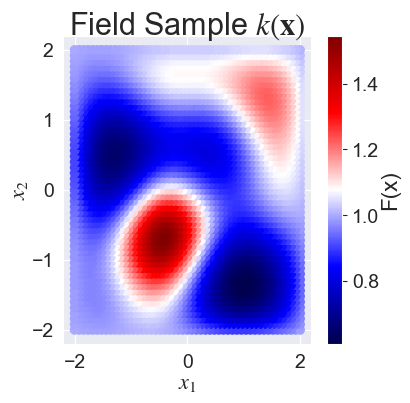

In [ ]:
hm_3.plot_field()

In [ ]:
hm_3.get_data(1.0)

KeyboardInterrupt: 

In [ ]:
from pydci.log import logger
from scipy.stats import multivariate_normal, uniform


def get_gaussian_initial_samples(self, mean=1.0, std_dev=1.0, num_samples=10):
    """
    Generate initial samples from uniform distribution over domain set by
    `self.set_domain`.
    """
    # Draw from n-dimensional Gaussian centered at `mean` with `std_dev` variance
    # Dimension equal to dimension of `self.n_params`
    logger.info(
        f"Drawing {num_samples} from multivariate normal at:\n"
        + f"\tmean: {mean}\n\tstd_dev: {std_dev}"
    )
    mean = np.ones(self.n_params) * mean if isinstance(mean, (int, float)) else mean
    std_dev = (
        np.ones(self.n_params) * std_dev
        if isinstance(std_dev, (int, float))
        else std_dev
    )
    pi_in = multivariate_normal(mean=mean, cov=std_dev)
    samples = pi_in.rvs(size=num_samples)
    return pi_in, samples

In [ ]:
num_samples = 500
pi_in, samples = get_gaussian_initial_samples(hm_3, num_samples=num_samples)
samples.shape

[07/31/23 18:02:48] INFO     Drawing 500 from multivariate normal at:                              ]8;id=358995;file:///var/folders/_1/y1tmd_l95j903jlk5yydl1f40000gn/T/ipykernel_52027/3351901359.py\3351901359.py]8;;\:]8;id=20328;file:///var/folders/_1/y1tmd_l95j903jlk5yydl1f40000gn/T/ipykernel_52027/3351901359.py#16\16]8;;\
                                     mean: 1.0                                                                     
                                     std_dev: 1.0                                                                  

(500, 10)

In [ ]:
disable_log()
hm_3.forward_solve(samples, restart=True)

In [ ]:
from pydci import PCAMUDProblem
from pydci.utils import get_df

measurements = get_df(hm_3.data[-1].dropna(), "q_lam_obs", hm_3.n_sensors)
measurements, measurements.shape

(array([[-0.00317942, -0.02755138,  0.07319754, ...,  0.02780154,
         -0.07817695,  0.02981863],
        [ 0.02412786,  0.07835142, -0.07532857, ...,  0.14566627,
          0.09203445,  0.04648463],
        [ 0.02867066, -0.00996445,  0.00710787, ..., -0.06938206,
         -0.01573445, -0.01376611],
        ...,
        [-0.01812432,  0.06861213, -0.0536534 , ...,  0.13982382,
          0.07208353,  0.09487232],
        [-0.02852655,  0.01385533,  0.11276158, ...,  0.04194105,
          0.06295833,  0.025753  ],
        [-0.02217587,  0.04708192, -0.02650854, ..., -0.0227698 ,
          0.03784738,  0.01685407]]),
 (11, 500))

In [ ]:
measurements.ravel().shape

(5500,)

In [ ]:
disable_log()
prob = PCAMUDProblem(
    hm_3.samples[-1], measurements.ravel(), hm_3.measurement_noise, pi_in=pi_in
)
prob.solve_it(pca_components=[[0, 1, 2]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,lam_MUD_4,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i
0,0.226825,2.068131,-0.480902,0.836184,1.307526,1.604113,-0.588028,-0.512855,0.544227,0.769523,0.176435,-0.744277,239,"[0, 1, 2]","range(4950, 5500)",9


In [ ]:
prob.mud_point

array([-0.48090168,  0.83618424,  1.30752574,  1.60411332, -0.58802756,
       -0.51285453,  0.54422699,  0.76952275,  0.17643451, -0.74427653])

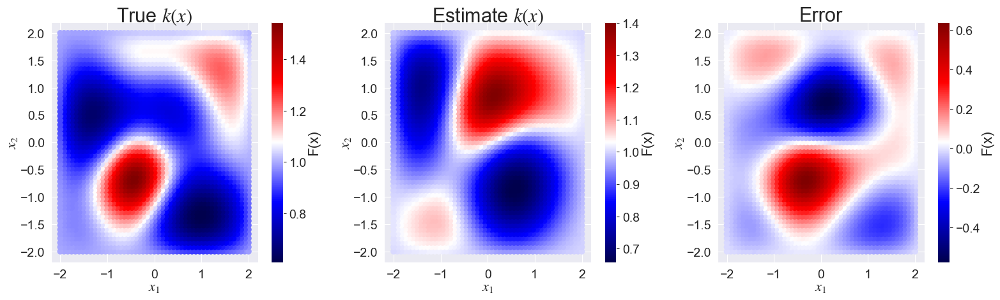

In [ ]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm_3.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm_3.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm_3.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("Error")

fig.tight_layout()

### Second iteration

In [ ]:
hm_3.get_data(1.0)

In [ ]:
measurements = get_df(hm_3.data[-1].dropna(), "q_lam_obs", hm_3.n_sensors)
measurements, measurements.shape

(array([[ 0.01483737,  0.06972236,  0.01876941, ..., -0.09672661,
          0.00149668, -0.02514891],
        [ 0.06940723,  0.09757674,  0.00500334, ...,  0.13613502,
         -0.04941342,  0.08377173],
        [ 0.04789538, -0.02190484, -0.09207588, ...,  0.09699546,
          0.03104305,  0.03871062],
        ...,
        [-0.02910159,  0.0222603 , -0.10658916, ...,  0.05397587,
          0.13039127,  0.14793121],
        [ 0.09401623,  0.05985476, -0.05636157, ...,  0.05626951,
          0.04942577,  0.03040665],
        [-0.07613814, -0.07867057,  0.05112792, ..., -0.07183673,
          0.04447727, -0.01671055]]),
 (11, 500))

In [ ]:
samples = prob.sample_dist(num_samples=500)
pi_in = prob.dists["pi_up"]

In [ ]:
disable_log()
hm_3.forward_solve(samples, restart=True)

Solving model sample set: |██▉                 | ▃▅▇ 73/500 [15%] in 9:13 (~54:26, 0.1/s)                               

# Example from https://fenicsproject.discourse.group/t/equivalent-for-expression-in-dolfinx/2641/12

Used this example to figure out how to set a time dependent forcing function:

In [ ]:
from dolfinx import mesh, fem
from dolfinx.fem import FunctionSpace, Function, Constant
from ufl import TestFunction, dx, inner
import numpy as np
from mpi4py import MPI


class MyExpression:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(x.shape[1], np.sin(self.t) * x[0])


def test():
    """
    Test example from
    https://fenicsproject.discourse.group/t/equivalent-for-expression-in-dolfinx/2641/12
    """
    # If your Expression is not spatially dependent, use Constant
    # f = Constant(mesh, 0)
    # L = inner(f, v)*dx
    # f.value = np.sin(2)
    mesh = mesh.create_unit_square(MPI.COMM_WORLD, 10, 10)
    V = FunctionSpace(mesh, ("CG", 1))
    f = MyExpression()
    f.t = 0
    w = Function(V)
    v = TestFunction(V)
    L = inner(w, v) * dx
    w.interpolate(f.eval)
    fem.form(L)
    # print(fbem.petsc.assemble_vector(fem.form(L)))

# Old results

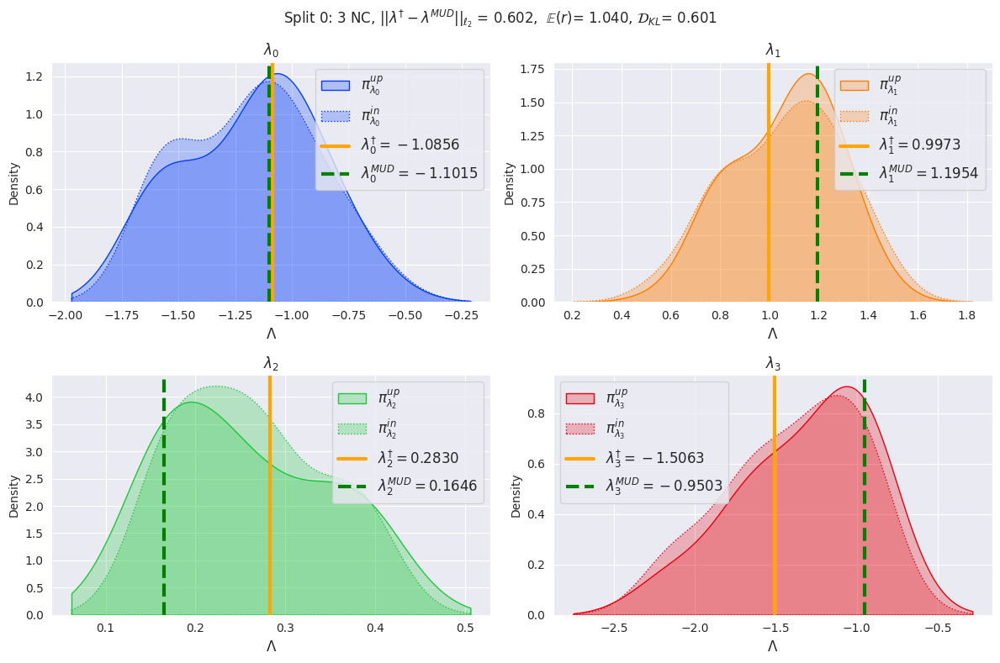

In [ ]:
heat_model.probs[0].param_density_plots(lam_true=heat_model.lam_true)

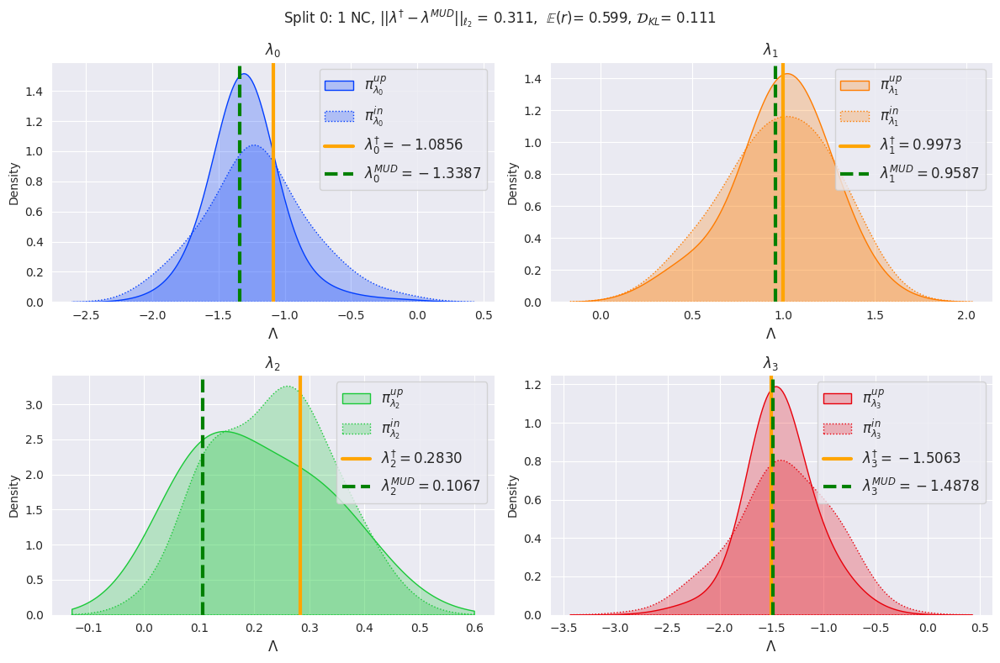

In [ ]:
heat_model.probs[-1].param_density_plots(lam_true=heat_model.lam_true)

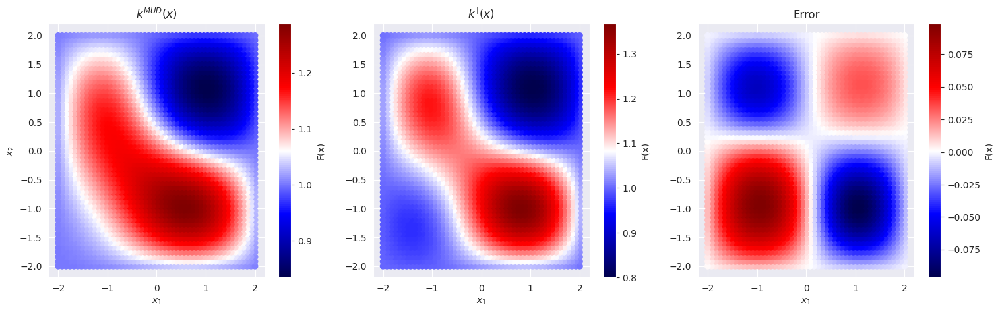

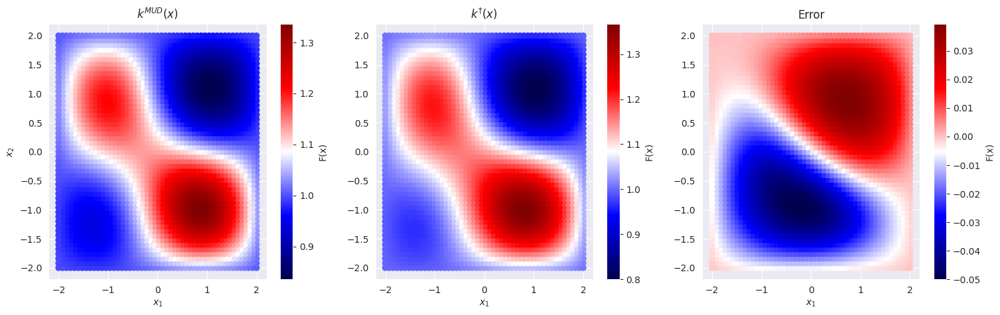

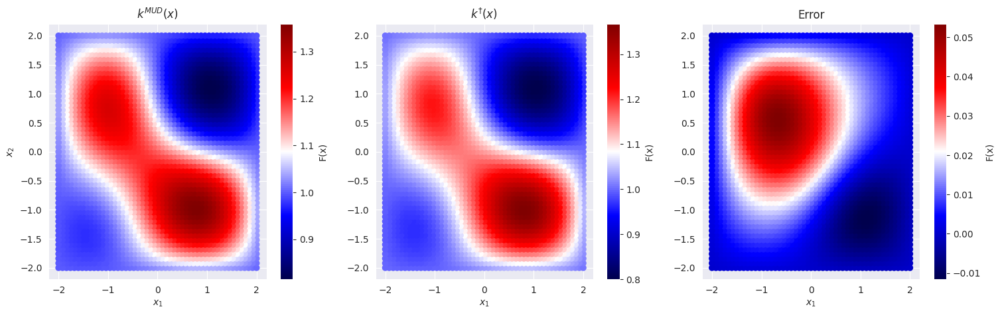

In [ ]:
def plot_field_sol(heat_model, iteration=0):
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    heat_model.plot_field(field=heat_model.probs[iteration].mud_point, ax=ax[0])
    ax[0].set_title("$k^{MUD}(x)$")
    heat_model.plot_field(field=heat_model.lam_true, ax=ax[1])
    ax[1].set_title("$k^{\dagger}(x)$")
    ax[1].set_ylabel("")
    heat_model.plot_field(
        field=heat_model.probs[iteration].mud_point, diff=heat_model.lam_true, ax=ax[2]
    )
    ax[2].set_title("Error")
    ax[2].set_ylabel("")
    fig.tight_layout


for i in range(len(heat_model.probs)):
    plot_field_sol(heat_model, iteration=i)

# Num Modes = 10

Increase number of params

In [ ]:
np.random.seed(123)

importlib.reload(hm)
heat_model2 = hm.HeatModel(nmodes=10, max_states=50)
heat_model2.estimate_params([0.1, 0.2, 0.3, 0.4, 0.5], num_samples=100)

[04/21/23 06:13:30] WARNING  Pyvista not found                                                     ]8;id=37718;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=429962;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/examples/heat_model.py#24\24]8;;\

[04/21/23 06:13:36] INFO     Drawing 100 from uniform at:                                              ]8;id=675452;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=246421;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#251\251]8;;\
                                     loc: [-1.6284459   0.49867272  0.14148925 -2.25944207 -0.86790038             
                             0.82571827                                                                            
                              -3.64001887 -0.64336894  0.63296813 -1.3001106 ]                                     
                                     scale: [1.0856306  0.99734545 0.2829785  1.50629471 0.57860025                
                             1.65143654                                                                            
                              2.42667924 0.42891263 1.26593626 0.8667404 ]                                         

                    INFO     Starting iteration from 0.0 to 0.1                                        ]8;id=313636;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=163885;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#502\502]8;;\

[04/21/23 06:13:37] INFO     end_point: 0.0, [ 0.05486596  0.0069361  -0.04177233 ... -0.04220415      ]8;id=540862;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=198414;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#169\169]8;;\
                             -0.09562734                                                                           
                               0.00950829]                                                                         

Solving model sample set: |██████▋             | ▂▂▄ 33/100 [33%] in 27s (~57s, 

In [ ]:
heat_model2.probs[-1].split_results

e_r        kl  lam_MUD_0  lam_MUD_1  lam_MUD_2   
split nc qoi_comb                                                        
0     1  0         0.565419  0.394487  -0.716982   1.679628   0.570665  \
      2  0         0.216006  0.524723  -0.590240   1.052694   0.300730   
      3  0         0.100875  0.494597  -0.590240   1.052694   0.300730   
      4  0         0.047903  0.434479  -0.590240   1.052694   0.300730   
      5  0         0.004259  0.525457  -1.180029   0.983414   0.447064   
      6  0         0.000816  1.018789  -0.575421   0.587249   0.040367   
      7  0         0.000460  1.079205  -0.575421   0.587249   0.040367   
      8  0         0.000084  1.540604  -1.098010   0.845948   0.011891   
      9  0         0.000043  1.800293  -1.098010   0.845948   0.011891   
      10 0         0.000014  1.646176  -0.716982   1.679628   0.570665   

                   lam_MUD_3  lam_MUD_4  lam_MUD_5  lam_MUD_6  lam_MUD_7   
split nc qoi_comb                                                          
0     1  0         -1.031287  -0.868979   2.037876  -4.117301  -0.362467  \
      2  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      3  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      4  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      5  0         -0.574936  -0.539496   0.049587  -2.999707  -0.253100   
      6  0         -1.449368  -0.112898   3.304668  -2.442955  -0.456310   
      7  0         -1.449368  -0.112898   3.304668  -2.442955  -0.456310   
      8  0         -1.118476  -0.256675   1.915368  -0.902907  -0.470322   
      9  0         -1.118476  -0.256675   1.915368  -0.902907  -0.470322   
      10 0         -1.031287  -0.868979   2.037876  -4.117301  -0.362467   

                   lam_MUD_8  lam_MUD_9  predict_delta  within_thresh   
split nc qoi_comb                                                       
0     1  0          2.216736  -1.388417       0.434581           True  \
      2  0         -0.138245  -0.208366       0.783994          False   
      3  0         -0.138245  -0.208366       0.899125          False   
      4  0         -0.138245  -0.208366       0.952097          False   
      5  0          1.418394  -1.759890       0.995741          False   
      6  0          0.576993  -0.406242       0.999184          False   
      7  0          0.576993  -0.406242       0.999540          False   
      8  0          2.135069  -0.120351       0.999916          False   
      9  0          2.135069  -0.120351       0.999957          False   
      10 0          2.216736  -1.388417       0.999986          False   

                   closest  max_kl  min_kl  
split nc qoi_comb                           
0     1  0            True    True    True  
      2  0           False   False   False  
      3  0           False   False   False  
      4  0           False   False   False  
      5  0           False   False   False  
      6  0           False   False   False  
      7  0           False   False   False  
      8  0           False   False   False  
      9  0           False   False   False  
      10 0           False   False   False

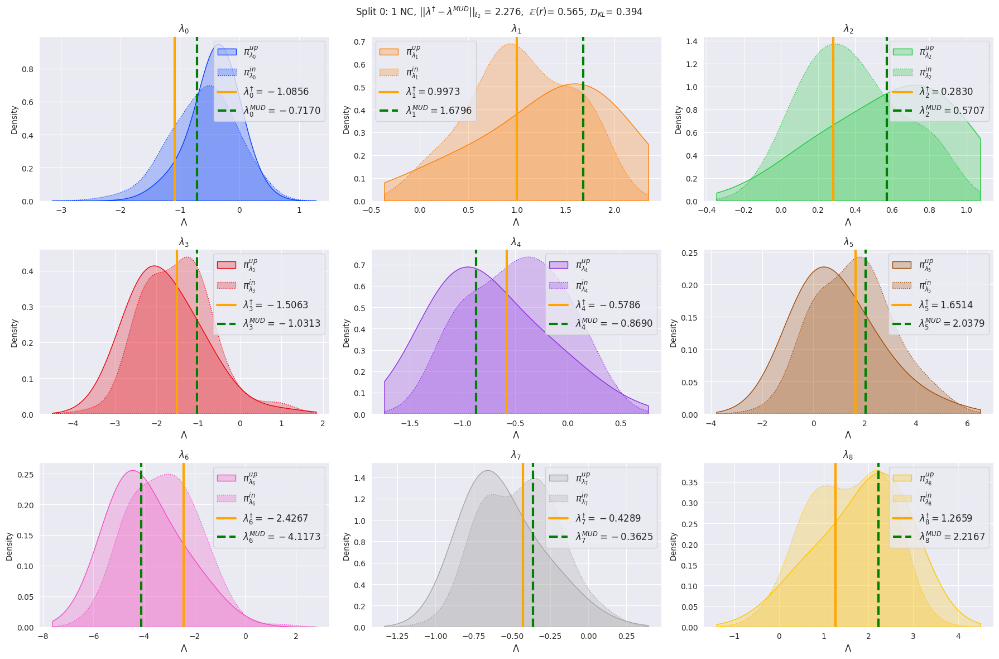

In [ ]:
heat_model2.probs[-1].param_density_plots(lam_true=heat_model2.lam_true)

In [ ]:
heat_model2.probs[-1].mud_point

array([-0.71698221,  1.67962815,  0.57066484, -1.031287  , -0.86897882,
        2.03787551, -4.11730066, -0.36246691,  2.21673642, -1.38841707])

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

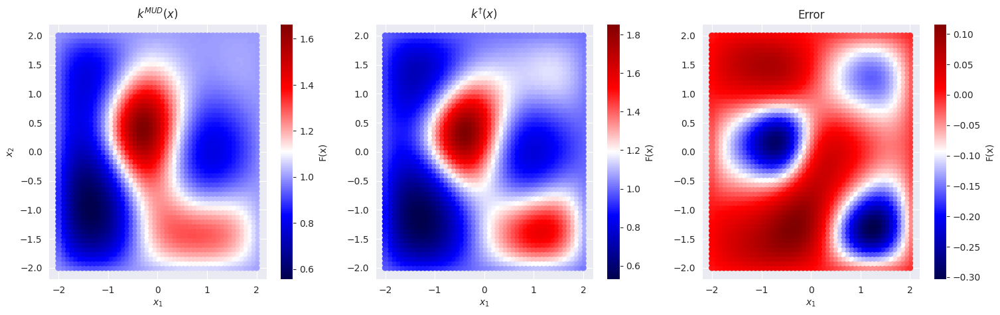

In [ ]:
iteration = 0
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

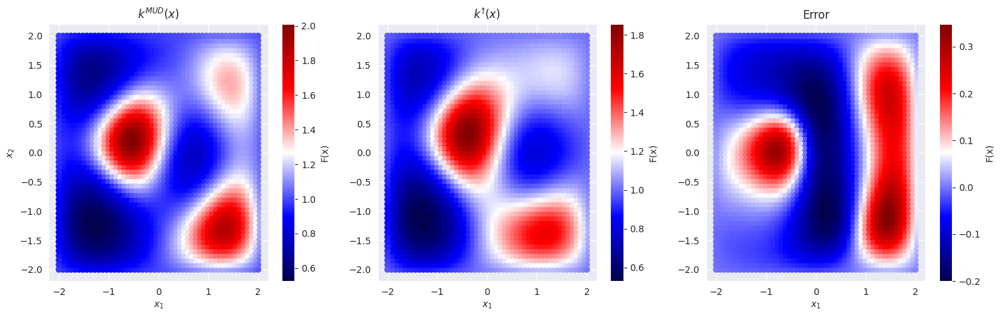

In [ ]:
iteration = -2
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

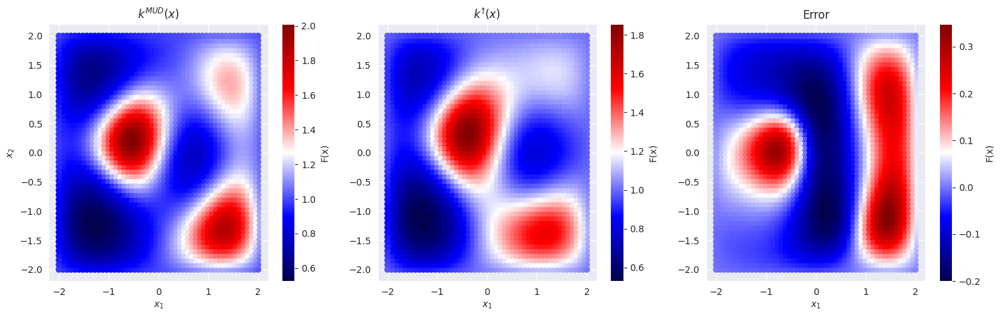

In [ ]:
iteration = -1
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

## Residuals

Lets see the residual between observed and predicted for sample.
Note observed here has no noise yet.

In [ ]:
idx = 1
gif_fname = f"s_{idx}.gif"
heat_model.output_gif(samples.loc[f"s_{idx}"], gif_fname, diff=sol)
Image(url=gif_fname)

|███████████████████████████████████████▊⚠︎ (!) 200/201 [100%] in 8.9s (22.44/s)                                         
